# Feature Detection

국민대학교 차량지능특론 SLAM 파트 과제 1

- 학번 : A2021019
Feature Detection

국민대학교 차량지능특론 SLAM 파트 과제 1

- 학번 : A2021019
- 이름 : 김태산

---

OpenCV를 사용하여 다음과 같은 다양한 feature detection 알고리즘을 사용해본다.

- Harris corner detection
- FAST
- ORB (Oriented FAST and Rotated BRIEF)
- SIFT (Scale-Invariant Feature Transform)
- SURF (Speeded-Up Robust Features)


**참고**

- [OpenCV tutorial - Feature Detection and Description](https://docs.opencv.org/master/db/d27/tutorial_py_table_of_contents_feature2d.html)
- [OpenCV document](https://docs.opencv.org/2.4/modules/imgproc/doc/feature_detection.html)
- [이미지 특징 추출 (데이터 사이언스 스쿨)](https://datascienceschool.net/view-notebook/7eb4b2a440824bb0a8c2c7ce3da7a4e2/)

---

**[중요] 과제 제출 방법**
- 과제 제출 기한은 2021년 6월 14일까지입니다.
- 과제는 Colab에서 작성한 것을 다운받아 (파일-.ipynb 다운로드) 가상 대학에 업로드합니다. (이외의 제출 방법은 인정하지 않음)
- 제출 시 파일 제목은 '학번_이름' 으로 저장합니다.

# OpenCV 버전 변경

SIFT, SURF Feature 사용을 위해 현재 Colab 서버에 설치되어 있는 OpenCV 버전을 변경한다.

In [2]:
!pip3 uninstall opencv-python
!pip3 install -U opencv-contrib-python==3.4.2.17

Uninstalling opencv-python-4.1.2.30:
  Would remove:
    /usr/local/lib/python3.7/dist-packages/cv2/*
    /usr/local/lib/python3.7/dist-packages/opencv_python-4.1.2.30.dist-info/*
Proceed (y/n)? y
  Successfully uninstalled opencv-python-4.1.2.30
     |████████████████████████████████| 30.6MB 137kB/s 
  Found existing installation: opencv-contrib-python 4.1.2.30
    Uninstalling opencv-contrib-python-4.1.2.30:
      Successfully uninstalled opencv-contrib-python-4.1.2.30


In [3]:
# 관련 패키지 임포트
import sys
import numpy as np
import cv2 as cv
import matplotlib.pyplot as plt

print('python', sys.version)
print('numpy', np.__version__)
print('opencv', cv.__version__)

python 3.7.10 (default, May  3 2021, 02:48:31) 
[GCC 7.5.0]
numpy 1.19.5
opencv 3.4.2


## Google Drive와 연동하기

구글 드라이브와 colab을 연동하여 드라이브에 있는 파일들을 가져올 수 있게 한다.

- 아래 코드를 실행
- 출력된 링크를 클릭해 구글 계정 로그인 
- 로그인 후 나오는 코드를 복사하여 붙여넣기

[참고: 코랩 사용법 (데이터 사이언스 스쿨)](https://datascienceschool.net/view-notebook/f9d9fddb7cc7494a9e4be99f0e137be0/)


In [4]:
# mount
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


좌측의 파일 아이콘을 선택하거나 아래 명령어를 통해 파일을 확인할 수 있다.

In [5]:
!ls '/content/drive/My Drive/Colab Notebooks/Vehicle Intelligence/'

work1


In [6]:
ROOT = '/content/drive/MyDrive/Colab Notebooks/Vehicle Intelligence/work1/'

### opencv를 사용해 이미지 불러오기

- `cv.imread()`를 이용해 이미지를 불러오면 RGB가 아닌 BGR 이미지임을 유의해야 한다.

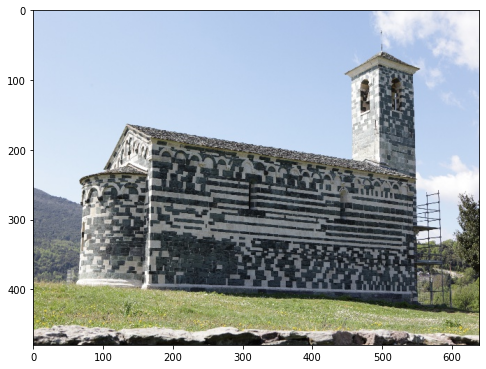

In [7]:
img = cv.imread( ROOT + 'feature/DPP_0010.JPG')

plt.figure(figsize=(8,8))
plt.imshow(img[:,:,::-1])
plt.show()

## Harris Corner Detection

해리스 코너 추출 함수 `cornerHarris`는 이미지 위에 커널을 이동시키면서 그레디언트의 변화량을 구하고 이 값을 적절한 기준값으로 구별하여 코너점을 찾는다.

**과제**
- 해리스 코너를 찾고, 이를 시각화한다.
- 파라미터를 바꿔가며 실험해본다.
- 제공한 이미지 외에 다른 이미지에도 적용하여 분석해 본다.

관련 함수
`dst	=	cv.cornerHarris(	src, blockSize, ksize, k[, dst[, borderType]]	)` 

### 1. 해리스 코너를 찾고, 이를 시각화한다.

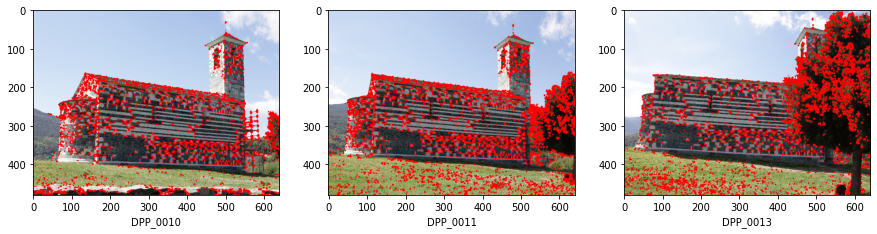

In [ ]:
img = cv.imread(ROOT + 'feature/DPP_0010.JPG')
gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)

# To-do
img_name = ['feature/DPP_0010.JPG', 'feature/DPP_0011.JPG', 'feature/DPP_0013.JPG']

def Harris_detector(path, blockSz=2, ksz=3, k=0.04, borderType=1):
  img = cv.imread(path)
  gray = np.float32(cv.cvtColor(img, cv.COLOR_BGR2GRAY))
  dst = cv.cornerHarris(gray, blockSize=blockSz, ksize=ksz, k=k, borderType=borderType)
  dst = cv.dilate(dst, None)
  img[dst>0.01*dst.max()] = [0, 0, 255]
  return img


plt.figure(figsize=(15,5))
for i, name in enumerate(img_name):
  path = ROOT + name
  img = Harris_detector(path)
  plt.subplot('13' + str(i + 1))
  plt.imshow(img[:,:,::-1])
  plt.xlabel(name[8:16])
plt.show()

### 2. 파라미터를 바꿔가며 실험해본다.
#### 2-1. blockSize 변화
- 결과를 보면, blockSize가 증가할수록 더 많은 코너를 추출하는 것을 알 수 있다.

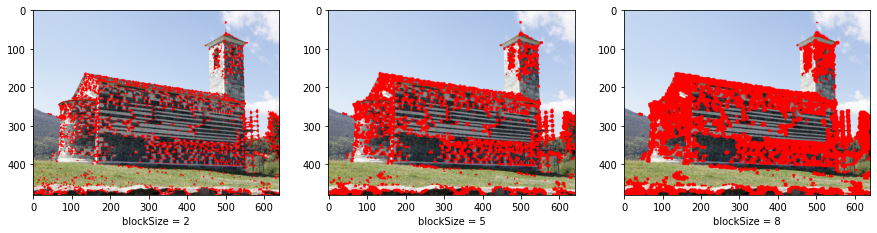

In [ ]:
path = ROOT + img_name[0]
plt.figure(figsize=(15,5))
for idx, i in enumerate(range(2, 11, 3)):
  img = Harris_detector(path, blockSz=i)
  plt.subplot('13' + str(idx + 1))
  plt.imshow(img[:,:,::-1])
  plt.xlabel('blockSize = ' + str(i))
plt.show()

#### 2-2. ksize 변화
- ksize는 Sobel derivative 조리개 파라미터로, 홀수만 입력할 수 있다.
- 결과를 보면, ksize가 작을수록 더 많은 코너를 추출하는 것을 알 수 있다.

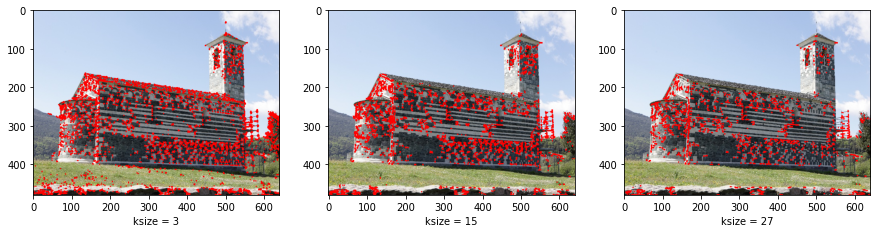

In [ ]:
path = ROOT + img_name[0]
plt.figure(figsize=(15,5))
for idx, i in enumerate(range(3, 31, 12)):
  img = Harris_detector(path, ksz=i)
  plt.subplot('13' + str(idx + 1))
  plt.imshow(img[:,:,::-1])
  plt.xlabel('ksize = ' + str(i))
plt.show()

#### 2-3. k 변화
- k는 해리스 코너 추출 방정식에서 사용하는 자유 파라미터(free parameter)이다.
- 결과를 보면, k가 작을수록 더 많은 코너를 추출하는 것을 알 수 있다.

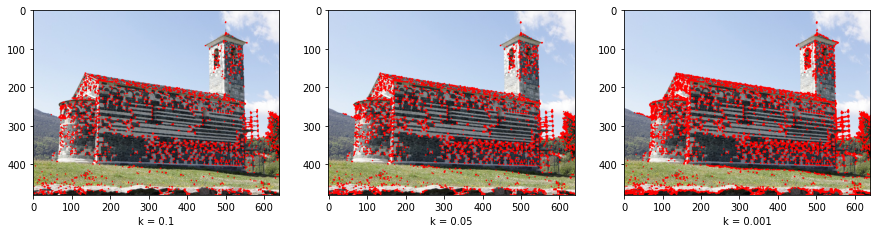

In [ ]:
path = ROOT + img_name[0]
k = [0.1, 0.05, 0.001]
plt.figure(figsize=(15,5))
for idx, i in enumerate(k):
  img = Harris_detector(path, k=i)
  plt.subplot('13' + str(idx + 1))
  plt.imshow(img[:,:,::-1])
  plt.xlabel('k = ' + str(i))
plt.show()

#### 2-4. borderType 변화
- borderType은 pixel extrapolation method에 대한 파라미터이다.
- 결과를 보면, borderType이 0일 때보다 1과 2일 때 가장 많은 코너를 추출하는 것을 알 수 있다.

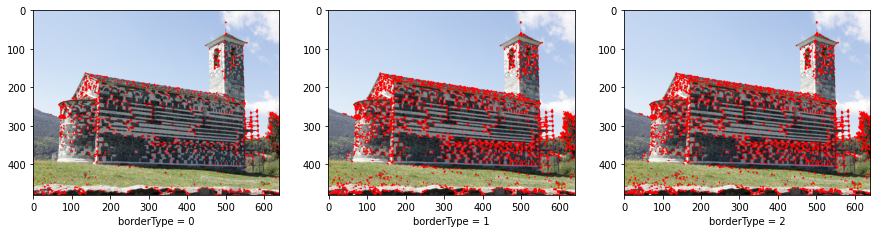

In [ ]:
path = ROOT + img_name[0]
plt.figure(figsize=(15,5))
for idx, i in enumerate(range(0, 3)):
  img = Harris_detector(path, borderType=i)
  plt.subplot('13' + str(idx + 1))
  plt.imshow(img[:,:,::-1])
  plt.xlabel('borderType = ' + str(i))
plt.show()

### 3. 제공한 이미지 외에 다른 이미지에도 적용하여 분석해 본다.
- 다른 이미지에 Harris corner detector를 적용해 본 결과, 아래와 같이 코너를 매우 잘 추출하는 것을 볼 수 있다.

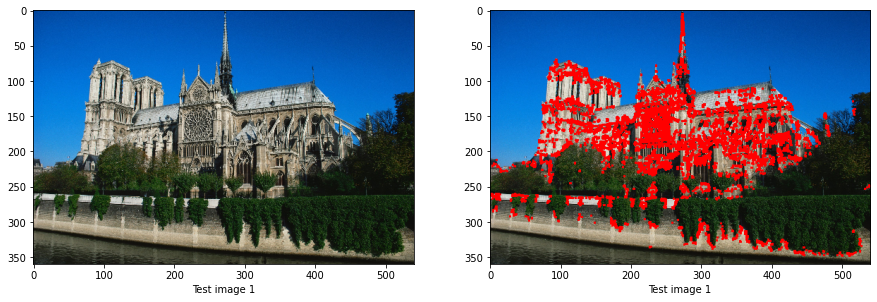

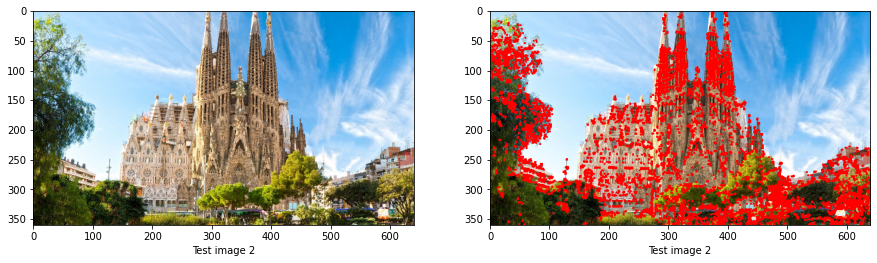

In [ ]:
test_name = ['feature/test_im1.PNG', 'feature/test_im2.PNG']
for i, name in enumerate(test_name):
  plt.figure(figsize=(15, 15))
  for j in range(len(test_name)):
    path = ROOT + name
    img = cv.imread(path)
    height = 360
    width = int(img.shape[1] * height / img.shape[0])
    img = cv.resize(img, (width, height))
    if j != 0:
      gray = np.float32(cv.cvtColor(img, cv.COLOR_BGR2GRAY))
      dst = cv.cornerHarris(gray, blockSize=2, ksize=3, k=0.04, borderType=1)
      dst = cv.dilate(dst, None)
      img[dst>0.01*dst.max()] = [0, 0, 255]
    plt.subplot(str(i + 1) + '2' + str(j + 1))
    plt.imshow(img[:,:,::-1])
    plt.xlabel('Test image ' + str(i + 1))
plt.show()

### Fast Corner Detection 

연산이 빠른 corner detection 알고리즘이다 


**과제**
- FAST feature를 찾고, 이를 시각화한다.
- 파라미터를 바꿔가며 실험해본다.
- 제공한 이미지 외에 다른 이미지에도 적용하여 분석해 본다.

관련 함수

`	retval	=	cv.FastFeatureDetector_create(	[, threshold[, nonmaxSuppression[, type]]]	)`

### 1. FAST feature를 찾고, 이를 시각화한다.

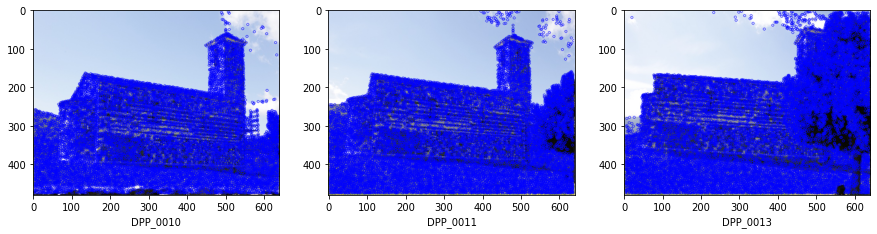

In [10]:
img = cv.imread( ROOT + 'feature/DPP_0010.JPG')
gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)

# To-do
img_name = ['feature/DPP_0010.JPG', 'feature/DPP_0011.JPG', 'feature/DPP_0013.JPG']

def fast_corner_detector(img, new=False, threshold=10, nonmaxSuppression=True, type=2):
  if new:
    height = 360
    width = int(img.shape[1] * height / img.shape[0])
    img = cv.resize(img, (width, height))
  gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)
  retval = cv.FastFeatureDetector_create(threshold=threshold, nonmaxSuppression=nonmaxSuppression, type=type)
  feature = retval.detect(gray, None)
  img = cv.drawKeypoints(img, feature, None, color=(255,0,0))
  return img


plt.figure(figsize=(15,5))
for i, name in enumerate(img_name):
  img = cv.imread(ROOT + name)
  img = fast_corner_detector(img)
  plt.subplot('13' + str(i + 1))
  plt.imshow(img[:,:,::-1])
  plt.xlabel(name[8:16])
plt.show()

### 2. 파라미터를 바꿔가며 실험해본다.
#### 2-1. threshold 변화
- threshold는 특징점을 판단하기 위한 임계값을 설정하는 파라미터이다.
- 결과를 보면, threshold가 작을수록 더 많은 코너를 추출하는 것을 알 수 있다.

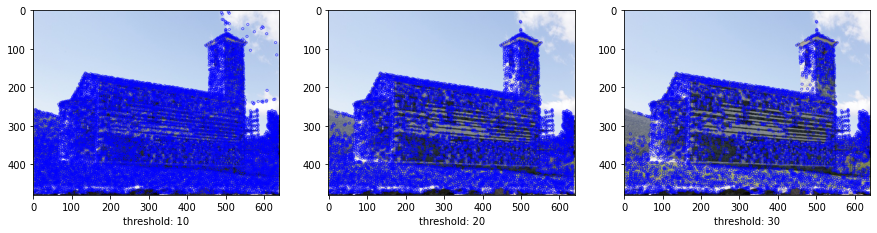

In [13]:
plt.figure(figsize=(15,5))
for idx, i in enumerate(range(10, 31, 10)):
  img = cv.imread(ROOT + img_name[0])
  img = fast_corner_detector(img, threshold=i)
  plt.subplot('13' + str(idx + 1))
  plt.imshow(img[:,:,::-1])
  plt.xlabel('threshold: ' + str(i))
plt.show()

#### 2-2 nonmaxSuppression 변화
- nonmaxSuppression은 특징점의 인접 픽셀들도 함께 특징점으로 추출되는 것을 하나의 특징점으로 필터링하기 위한 파라미터이다.
- 결과를 보면, nonmaxSuppression을 사용하였을 때 특징점이 더 적게 추출되는 것을 알 수 있다.

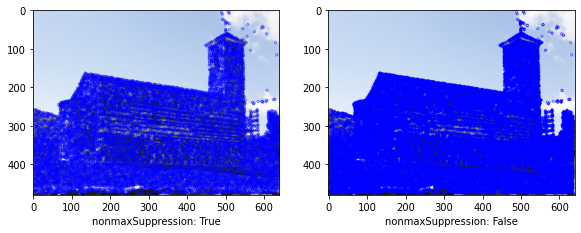

In [14]:
plt.figure(figsize=(15,5))
for idx, nms in enumerate([True, False]):
  img = cv.imread(ROOT + img_name[0])
  img = fast_corner_detector(img, nonmaxSuppression=nms)
  plt.subplot('13' + str(idx + 1))
  plt.imshow(img[:,:,::-1])
  plt.xlabel('nonmaxSuppression: ' + str(nms))
plt.show()

#### 2-3 type 변화
- type은 특징점을 추출할 때 특징점을 판단하기 위한 기준 픽셀 갯수와 기준 픽셀 갯수와 비교할 주변 픽셀의 갯수를 결정하는 파라미터이다.
- type=0이면 기준 픽셀 갯수 5개와 주변 픽셀 갯수 8개로, type=1이면 기준 픽셀 갯수 7개와 주변 픽셀 갯수 12개로, type=2이면 기준 픽셀 갯수 9개와 주변 픽셀 갯수 16개로 설정하여 특징점을 추출한다.
- 예를 들면, 기준 픽셀 갯수가 5개이고 주변 픽셀 갯수가 8개인 경우, 8개 중 5개 이상의 픽셀에 대해 중심 픽셀과의 값 차이가 임계값보다 크게 될 경우 해당 중심 픽셀을 특징점이라고 판단한다.
- 결과를 보면, type=2일 때 특징점을 비교할 픽셀 수가 가장 많은 만큼 특징점도 가장 많이 추출하는 것을 알 수 있다.

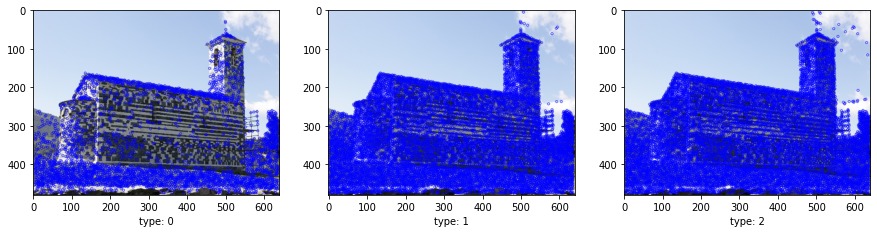

In [16]:
plt.figure(figsize=(15,5))
for i in range(3):
  img = cv.imread(ROOT + img_name[0])
  img = fast_corner_detector(img, type=i)
  plt.subplot('13' + str(i + 1))
  plt.imshow(img[:,:,::-1])
  plt.xlabel('type: ' + str(i))
plt.show()

### 3. 제공한 이미지 외에 다른 이미지에도 적용하여 분석해 본다.
- 다른 이미지에 fast corner detector를 적용해 본 결과, 아래와 같이 코너를 매우 잘 추출하는 것을 볼 수 있다.

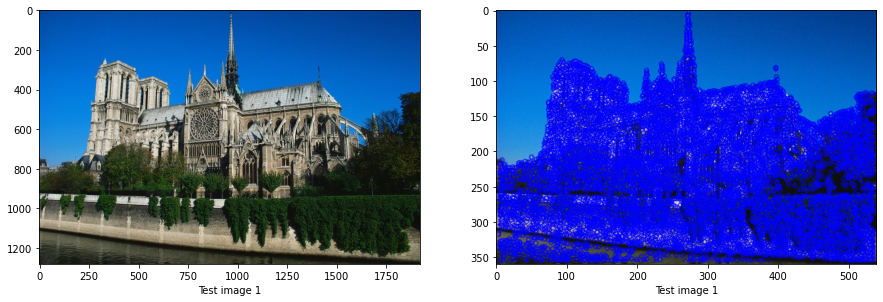

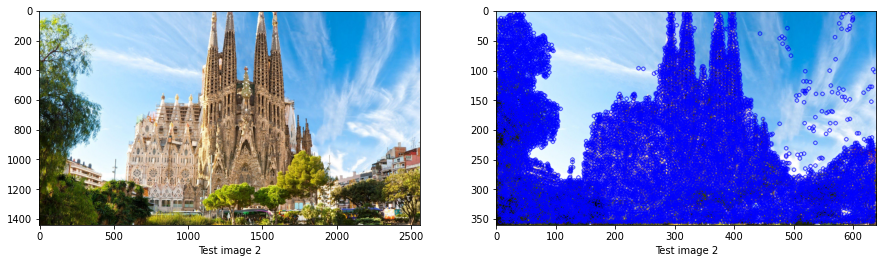

In [17]:
test_name = ['feature/test_im1.PNG', 'feature/test_im2.PNG']
for i, name in enumerate(test_name):
  plt.figure(figsize=(15, 15))
  for j in range(len(test_name)):
    path = ROOT + name
    img = cv.imread(path)
    if j != 0:
      img = fast_corner_detector(img, new=True)
    plt.subplot(str(i + 1) + '2' + str(j + 1))
    plt.imshow(img[:,:,::-1])
    plt.xlabel('Test image ' + str(i + 1))
plt.show()

### ORB(Oriented FAST and Rotated BRIEF) detector

FAST 와 BRIEF를 기반으로 만들어진 알고리즘이다. 논문에서는 SURF와 SIFT보다 매우 빠르고, SURF 보다 정확한, 낮은 컴퓨팅 파워 환경에서 돌리기에 좋은 알고리즘이라 소개 한다.

**과제**
-  ORB feature를 찾고, 이를 시각화한다.
- 파라미터를 바꿔가며 실험해본다.
- 제공한 이미지 외에 다른 이미지에도 적용하여 분석해 본다.

관련 함수

`	retval	=	cv.ORB_create(	[, nfeatures[, scaleFactor[, nlevels[, edgeThreshold[, firstLevel[, WTA_K[, scoreType[, patchSize[, fastThreshold]]]]]]]]]	)`

### 1. ORB feature를 찾고, 이를 시각화한다.


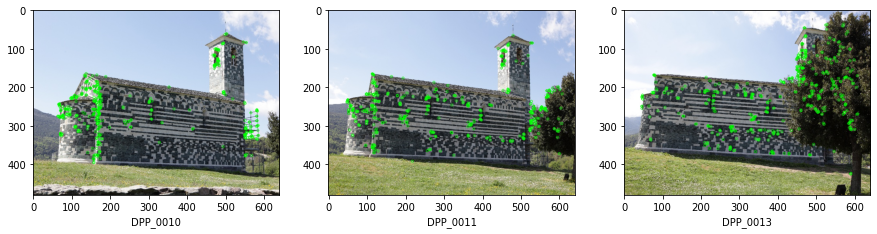

In [9]:
img = cv.imread( ROOT + 'feature/DPP_0010.JPG')
gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)

# To-do
img_name = ['feature/DPP_0010.JPG', 'feature/DPP_0011.JPG', 'feature/DPP_0013.JPG']

def ORB_detector(img, new=False, nfeatures=500, scaleFactor=1.2, nlevels=8, edgeThreshold=31, firstLevel=0,
                                 WTA_K=2, scoreType=cv.ORB_HARRIS_SCORE, patchSize=31, fastThreshold=20):
  if new:
    height = 360
    width = int(img.shape[1] * height / img.shape[0])
    img = cv.resize(img, (width, height))
  gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)
  retval = cv.ORB_create(nfeatures=nfeatures, scaleFactor=scaleFactor, nlevels=nlevels, edgeThreshold=edgeThreshold, firstLevel=firstLevel,
                          WTA_K=WTA_K, scoreType=scoreType, patchSize=patchSize, fastThreshold=fastThreshold)
  feature = retval.detect(gray, None)
  img = cv.drawKeypoints(img, feature, None, color=(0,255,0))
  return feature, img


plt.figure(figsize=(15,5))
for i, name in enumerate(img_name):
  img = cv.imread(ROOT + name)
  features, img = ORB_detector(img)
  plt.subplot('13' + str(i + 1))
  plt.imshow(img[:,:,::-1])
  plt.xlabel(name[8:16])
plt.show()

### 2. 파라미터를 바꿔가며 실험해본다.
#### 2-1. nfeatures 변화
- nfeatures는 한 번에 추출하려는 특징점의 최대 개수를 설정하는 파라미터이다.
- 결과를 보면, nfeatures의 값이 클수록 특징점을 더 많이 추출하는 것을 알 수 있다.

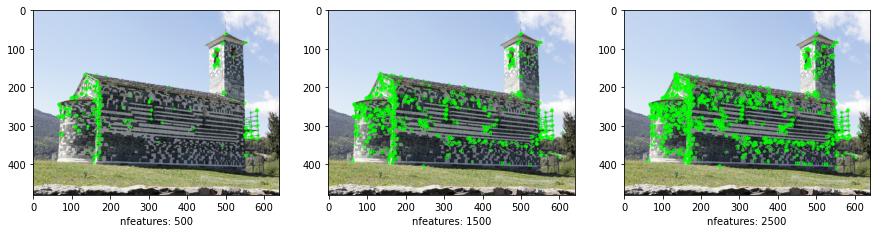

In [29]:
plt.figure(figsize=(15,5))
for idx, i in enumerate(range(500, 3000, 1000)):
  img = cv.imread(ROOT + img_name[0])
  feature, img = ORB_detector(img, nfeatures=i)
  plt.subplot('13' + str(idx + 1))
  plt.imshow(img[:,:,::-1])
  plt.xlabel('nfeatures: ' + str(i))
plt.show()

#### 2-2. scaleFactor 변화
- scaleFactor는 이미지의 피라미드를 설정하는 파라미터이다.
- 결과를 보면, scaleFactor 값이 작을수록 특징점을 더 많이 추출하는 반면, 값이 클수록 특징점들이 더 분산되어 추출되는 것으로 보인다.

scaleFactor: 1.2 -> # of features: 2000
scaleFactor: 2.0 -> # of features: 1719
scaleFactor: 2.5 -> # of features: 1718


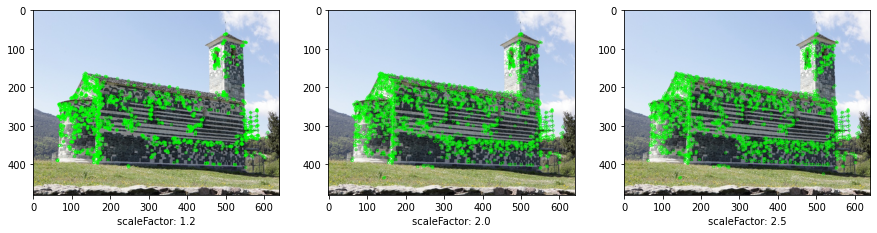

In [56]:
plt.figure(figsize=(15,5))
scaleFactors = [1.2, 2.0, 2.5]
for idx, i in enumerate(scaleFactors):
  img = cv.imread(ROOT + img_name[0])
  feature, img = ORB_detector(img, nfeatures=2000, scaleFactor=i)
  plt.subplot('13' + str(idx + 1))
  plt.imshow(img[:,:,::-1])
  print('scaleFactor:', i, '-> # of features:', len(feature))
  plt.xlabel('scaleFactor: ' + str(i))
plt.show()

### 2-3 nlevels 변화
- nlevels는 이미지 피라미드의 층 수를 설정하는 파라미터이다.
- 결과를 보면, nlevels가 증가할수록 좀 더 주요한 점(edge가 아닌 점)을 특징점으로 추출하는 경향을 보인다.

nlevels: 1 -> # of features: 2000
nlevels: 5 -> # of features: 2000
nlevels: 9 -> # of features: 2000


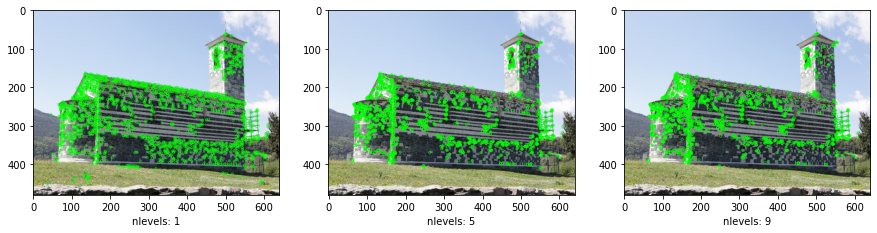

In [55]:
plt.figure(figsize=(15,5))
for idx, i in enumerate(range(1, 11, 4)):
  img = cv.imread(ROOT + img_name[0])
  feature, img = ORB_detector(img, nfeatures=2000, nlevels=i)
  plt.subplot('13' + str(idx + 1))
  plt.imshow(img[:,:,::-1])
  print('nlevels:', i, '-> # of features:', len(feature))
  plt.xlabel('nlevels: ' + str(i))
plt.show()

### 2-4 firstLevel 변화
- firstLevel은 원본 이미지를 넣을 피라미드의 층을 설정하는 파라미터이다.
- 결과를 보면, firstLevel의 값이 작을수록 좀 더 주요한 점(edge가 아닌 점)을 특징점으로 추출하는 경향을 보인다.

firstLevel: 0 -> # of features: 2000
firstLevel: 4 -> # of features: 2000
firstLevel: 8 -> # of features: 2000


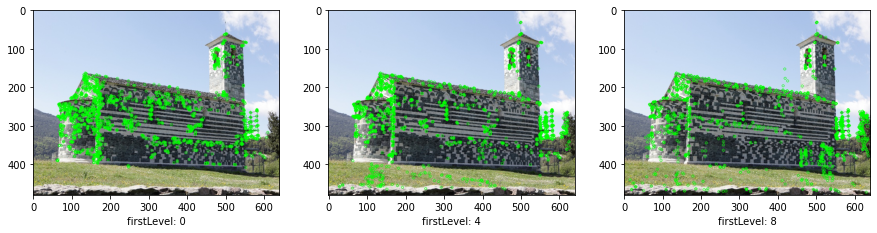

In [54]:
plt.figure(figsize=(15,5))
for idx, i in enumerate(range(0, 10, 4)):
  img = cv.imread(ROOT + img_name[0])
  feature, img = ORB_detector(img, nfeatures=2000, firstLevel=i)
  plt.subplot('13' + str(idx + 1))
  plt.imshow(img[:,:,::-1])
  print('firstLevel:', i, '-> # of features:', len(feature))
  plt.xlabel('firstLevel: ' + str(i))
plt.show()

### 3. 제공한 이미지 외에 다른 이미지에도 적용하여 분석해 본다.
- 다른 이미지에 ORB detector를 적용해 본 결과, 아래와 같이 코너를 매우 잘 추출하는 것을 볼 수 있다.

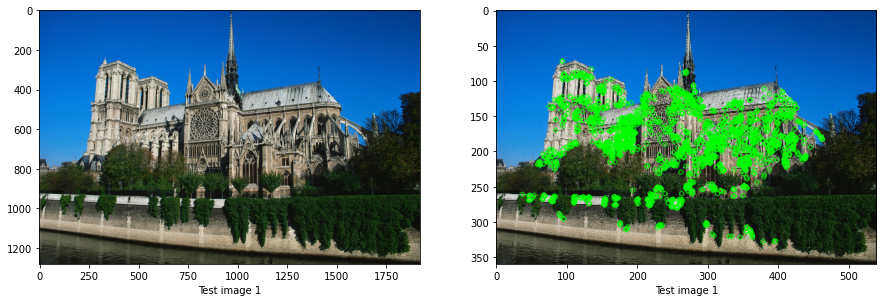

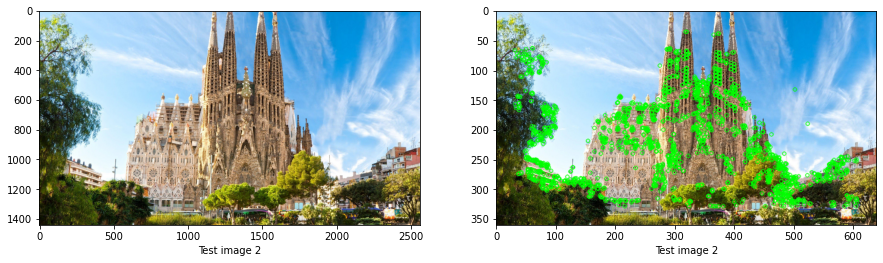

In [36]:
test_name = ['feature/test_im1.PNG', 'feature/test_im2.PNG']
for i, name in enumerate(test_name):
  plt.figure(figsize=(15, 15))
  for j in range(len(test_name)):
    path = ROOT + name
    img = cv.imread(path)
    if j != 0:
      feature, img = ORB_detector(img, new=True, nfeatures=2000)
    plt.subplot(str(i + 1) + '2' + str(j + 1))
    plt.imshow(img[:,:,::-1])
    plt.xlabel('Test image ' + str(i + 1))
plt.show()

### SIFT feature detection

SIFT(Scale-Invariant Feature Transform)은 특징점의 크기와 각도까지 같이 계산하여 이미지의 크기가 변하거나 회전해도 동일한 특징점을 찾을 수 있도록 하는 방법이다. 또한 특징점 근처의 이미지 특성(히스토그램)도 같이 계산해서 특징점 이미지의 모양도 구별할 수 있도록 한다.

**과제**
- SIFT feature를 찾고, 이를 시각화한다.
- 파라미터를 바꿔가며 실험해본다.
- 제공한 이미지 외에 다른 이미지에도 적용하여 분석해 본다.

관련 함수

`retval	=	cv.SIFT_create(	[, nfeatures[, nOctaveLayers[, contrastThreshold[, edgeThreshold[, sigma]]]]]	)
`

### 1. SIFT feature를 찾고, 이를 시각화한다.

In [38]:
# 아래 패키지를 임포트한다 
# !pip install opencv-contrib-python-nonfree

ERROR: Could not find a version that satisfies the requirement opencv-contrib-python-nonfree (from versions: none)
ERROR: No matching distribution found for opencv-contrib-python-nonfree


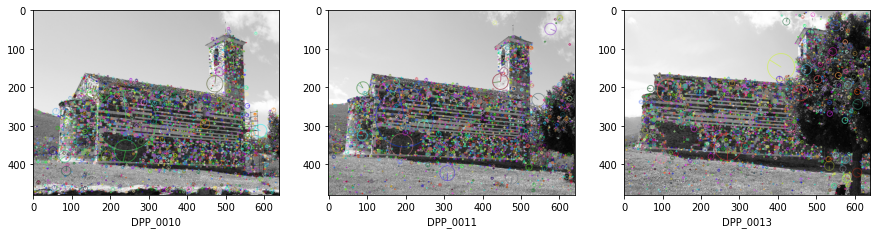

In [45]:
img = cv.imread( ROOT + 'feature/DPP_0010.JPG')
gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)

# To-do
img_name = ['feature/DPP_0010.JPG', 'feature/DPP_0011.JPG', 'feature/DPP_0013.JPG']

def SIFT_detector(img, new=False, nfeatures=0, nOctaveLayers=3, contrastThreshold=0.04, edgeThreshold=10, sigma=1.6):
  if new:
    height = 360
    width = int(img.shape[1] * height / img.shape[0])
    img = cv.resize(img, (width, height))
  gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)
  retval = cv.xfeatures2d.SIFT_create(nfeatures=nfeatures, nOctaveLayers=nOctaveLayers, contrastThreshold=contrastThreshold, edgeThreshold=edgeThreshold, sigma=sigma)
  feature = retval.detect(gray, None)
  img = cv.drawKeypoints(gray, feature, None, flags=cv.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
  return feature, img


plt.figure(figsize=(15,5))
for i, name in enumerate(img_name):
  img = cv.imread(ROOT + name)
  features, img = SIFT_detector(img)
  plt.subplot('13' + str(i + 1))
  plt.imshow(img[:,:,::-1])
  plt.xlabel(name[8:16])
plt.show()

### 2. 파라미터를 바꿔가며 실험해본다.
#### 2-1. nfeatures 변화
- nfeatures는 한 번에 추출하려는 특징점의 최대 개수를 설정하는 파라미터이다.
- 결과를 보면, nfeatures의 값이 클수록 특징점을 더 많이 추출하는 것을 알 수 있다.

nfeatures: 500 -> # of features: 500
nfeatures: 1500 -> # of features: 1500
nfeatures: 2500 -> # of features: 2500


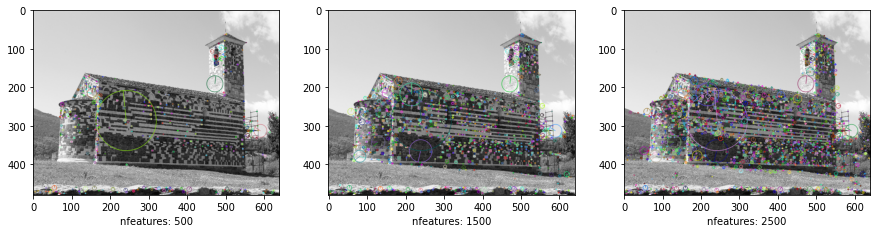

In [53]:
plt.figure(figsize=(15,5))
for idx, i in enumerate(range(500, 3000, 1000)):
  img = cv.imread(ROOT + img_name[0])
  feature, img = SIFT_detector(img, nfeatures=i)
  plt.subplot('13' + str(idx + 1))
  plt.imshow(img[:,:,::-1])
  print('nfeatures:', i, '-> # of features:', len(feature))
  plt.xlabel('nfeatures: ' + str(i))
plt.show()

#### 2-2. nOctaveLayers 변화
- nOctaveLayers는 이미지의 해상도로부터 자동으로 계산되는 여러 개의 옥타브 각각의 층의 개수를 설정하는 파라미터이다.
- 결과를 보면, nOctaveLayers의 값이 클수록 특징점을 더 많이 추출하는 것을 알 수 있다.

nOctaveLayers: 1 -> # of features: 1941
nOctaveLayers: 5 -> # of features: 4038
nOctaveLayers: 9 -> # of features: 5455


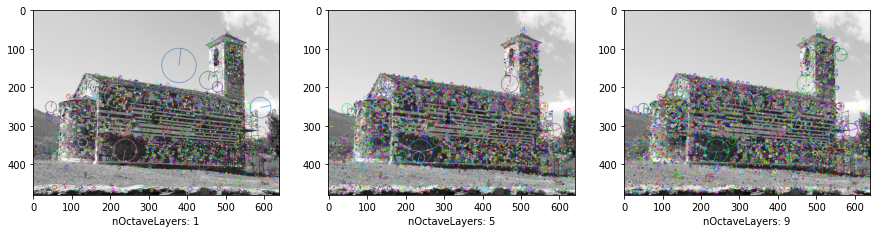

In [52]:
plt.figure(figsize=(15,5))
for idx, i in enumerate(range(1, 10, 4)):
  img = cv.imread(ROOT + img_name[0])
  feature, img = SIFT_detector(img, nOctaveLayers=i)
  plt.subplot('13' + str(idx + 1))
  plt.imshow(img[:,:,::-1])
  print('nOctaveLayers:', i, '-> # of features:', len(feature))
  plt.xlabel('nOctaveLayers: ' + str(i))
plt.show()

#### 2-3. contrastThreshold 변화
- contrastThreshold는 좋지 않은 특징점을 필터링하기 위한 파라미터로, 값이 클수록 해당 특징점들의 필터링이 많이 이루어진다.
- 결과를 보면, contrastThreshold의 값이 클수록 필터링이 많이 되어 더 적은 수의 특징점을 추출하지만, 의미있는 특징점들만 남았음을 알 수 있다.

 contrastThreshold: 0.01 -> # of features: 3619
 contrastThreshold: 0.05 -> # of features: 3024
 contrastThreshold: 0.09 -> # of features: 2028


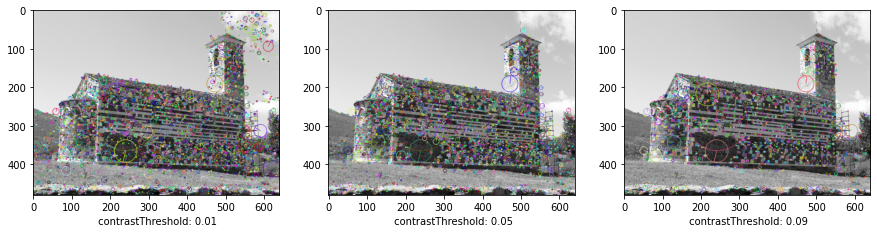

In [59]:
plt.figure(figsize=(15,5))
contrastThresholds = [0.01, 0.05, 0.09]
for idx, i in enumerate(contrastThresholds):
  img = cv.imread(ROOT + img_name[0])
  feature, img = SIFT_detector(img, contrastThreshold=i)
  plt.subplot('13' + str(idx + 1))
  plt.imshow(img[:,:,::-1])
  print(' contrastThreshold:', i, '-> # of features:', len(feature))
  plt.xlabel(' contrastThreshold: ' + str(i))
plt.show()

#### 2-4. edgeThreshold 변화
- edgeThreshold는 edge에서 추출된 특징점들을 필터링하기 위한 파라미터로, 해당 값이 작을수록 필터링이 많이 된다.
- 결과를 보면, edgeThreshold의 값이 작을수록 필터링이 많이 되어 더 적은 수의 특징점을 추출하지만, 의미있는 특징점들만 남았음을 알 수 있다.

edgeThreshold: 5 -> # of features: 2495
edgeThreshold: 25 -> # of features: 3637
edgeThreshold: 45 -> # of features: 3706


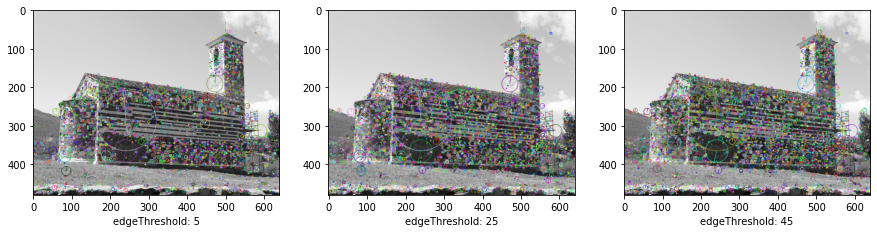

In [58]:
plt.figure(figsize=(15,5))
for idx, i in enumerate(range(5, 50, 20)):
  img = cv.imread(ROOT + img_name[0])
  feature, img = SIFT_detector(img, edgeThreshold=i)
  plt.subplot('13' + str(idx + 1))
  plt.imshow(img[:,:,::-1])
  print('edgeThreshold:', i, '-> # of features:', len(feature))
  plt.xlabel('edgeThreshold: ' + str(i))
plt.show()

#### 2-5. sigma 변화
- sigma는 입력된 이미지의 0번째 옥타브에 적용되는 표준편차 값이다.
- 결과를 보면, sigma의 값이 커질수록 특징점을 적게 추출하는 것을 알 수 있다.

sigma: 1 -> # of features: 6811
sigma: 3 -> # of features: 1305
sigma: 5 -> # of features: 394


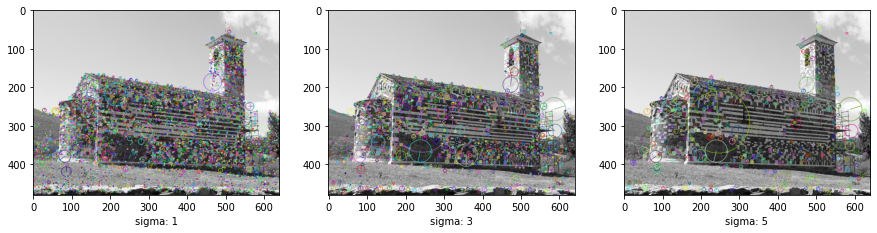

In [61]:
plt.figure(figsize=(15,5))
for idx, i in enumerate(range(1, 6, 2)):
  img = cv.imread(ROOT + img_name[0])
  feature, img = SIFT_detector(img, sigma=i)
  plt.subplot('13' + str(idx + 1))
  plt.imshow(img[:,:,::-1])
  print('sigma:', i, '-> # of features:', len(feature))
  plt.xlabel('sigma: ' + str(i))
plt.show()

### 3. 제공한 이미지 외에 다른 이미지에도 적용하여 분석해 본다.
- 다른 이미지에 SIFT detector를 적용해 본 결과, 아래와 같이 코너를 매우 잘 추출하는 것을 볼 수 있다.

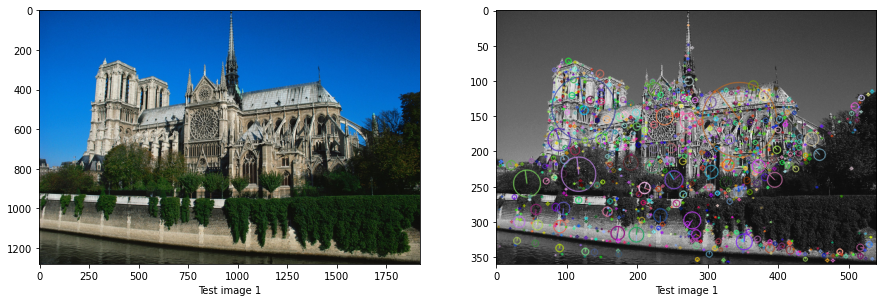

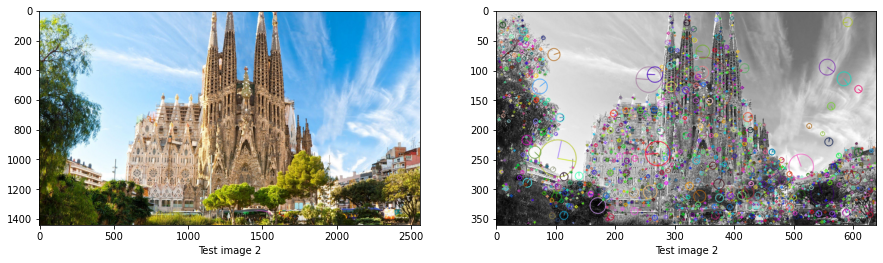

In [62]:
test_name = ['feature/test_im1.PNG', 'feature/test_im2.PNG']
for i, name in enumerate(test_name):
  plt.figure(figsize=(15, 15))
  for j in range(len(test_name)):
    path = ROOT + name
    img = cv.imread(path)
    if j != 0:
      feature, img = SIFT_detector(img, new=True, nfeatures=2000)
    plt.subplot(str(i + 1) + '2' + str(j + 1))
    plt.imshow(img[:,:,::-1])
    plt.xlabel('Test image ' + str(i + 1))
plt.show()

### SURF feature detection


SURF(Speeded-Up Robust Features)는 인텐서티 계산 방법을 간략화 하는 등의 방법으로 SIFT 방법의 속도와 안정성을 개선한 것이다. 

**과제**
- SURF feature를 찾고, 이를 시각화한다.
- 파라미터를 바꿔가며 실험해본다.
- 제공한 이미지 외에 다른 이미지에도 적용하여 분석해 본다.

관련 함수
- `retval	=	cv.xfeatures2d.SURF_create(	[, hessianThreshold[, nOctaves[, nOctaveLayers[, extended[, upright]]]]]	)
`
### 1. SURF feature를 찾고, 이를 시각화한다.

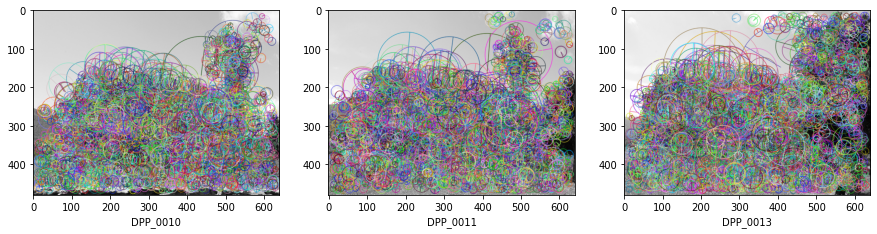

In [68]:
img = cv.imread( ROOT + 'feature/DPP_0010.JPG')
gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)

# To-do
img_name = ['feature/DPP_0010.JPG', 'feature/DPP_0011.JPG', 'feature/DPP_0013.JPG']

def SURF_detector(img, new=False, hessianThreshold=100, nOctaves=4, nOctaveLayers=3, extended=False, upright=False):
  if new:
    height = 360
    width = int(img.shape[1] * height / img.shape[0])
    img = cv.resize(img, (width, height))
  gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)
  retval = cv.xfeatures2d.SURF_create(hessianThreshold=hessianThreshold, nOctaves=nOctaves, nOctaveLayers=nOctaveLayers, extended=extended, upright=upright)
  feature = retval.detect(gray, None)
  img = cv.drawKeypoints(gray, feature, None, flags=cv.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
  return feature, img


plt.figure(figsize=(15,5))
for i, name in enumerate(img_name):
  img = cv.imread(ROOT + name)
  features, img = SURF_detector(img)
  plt.subplot('13' + str(i + 1))
  plt.imshow(img[:,:,::-1])
  plt.xlabel(name[8:16])
plt.show()

### 2. 파라미터를 바꿔가며 실험해본다.
#### 2-1. hessianThreshold 변화
- hessianThreshold는 특징점 추출 시 사용할 임계값을 설정하는 파라미터로, 이 값이 클수록 특징점은 적게 추출된다.
- 결과를 보면, hessianThreshold의 값이 클수록 특징점을 더 적게 추출하는 것을 알 수 있다.

hessianThreshold: 1000 -> # of features: 1573
hessianThreshold: 1800 -> # of features: 1073
hessianThreshold: 2600 -> # of features: 785


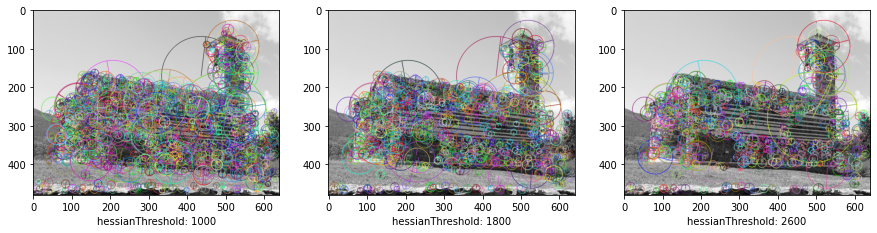

In [84]:
plt.figure(figsize=(15,5))
for idx, i in enumerate(range(1000, 3000, 800)):
  img = cv.imread(ROOT + img_name[0])
  feature, img = SURF_detector(img, hessianThreshold=i)
  plt.subplot('13' + str(idx + 1))
  plt.imshow(img[:,:,::-1])
  print('hessianThreshold:', i, '-> # of features:', len(feature))
  plt.xlabel('hessianThreshold: ' + str(i))
plt.show()

#### 2-2. nOctaves 변화
- nOctaves는 가우시안 피라미드 옥타브의 개수를 설정하는 파라미터로, 이 값이 클수록 특징점이 많이 추출된다.
- 결과를 보면, nOctaves의 값이 클수록 특징점을 더 많이 추출하는 것을 알 수 있다.

nOctaves: 1 -> # of features: 2405
nOctaves: 3 -> # of features: 3241
nOctaves: 5 -> # of features: 3263


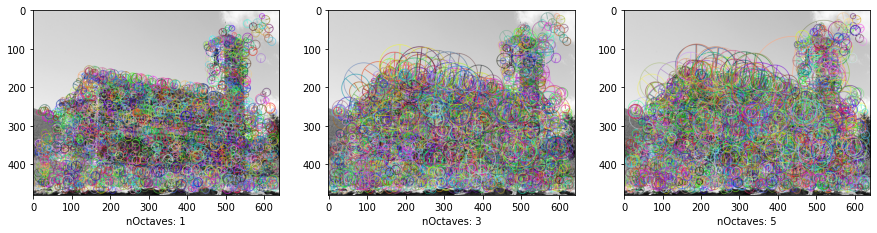

In [87]:
plt.figure(figsize=(15,5))
for idx, i in enumerate(range(1, 6, 2)):
  img = cv.imread(ROOT + img_name[0])
  feature, img = SURF_detector(img, nOctaves=i)
  plt.subplot('13' + str(idx + 1))
  plt.imshow(img[:,:,::-1])
  print('nOctaves:', i, '-> # of features:', len(feature))
  plt.xlabel('nOctaves: ' + str(i))
plt.show()

#### 2-3. nOctaveLayers 변화
- nOctaveLayers는 가우시안 피라미드의 각각의 옥타브마다 층 개수를 설정하는 파라미터이다.
- 결과를 보면, nOctaveLayers의 값이 클수록 특징점을 더 많이 추출하는 것을 알 수 있다.

nOctaveLayers: 1 -> # of features: 1519
nOctaveLayers: 3 -> # of features: 3263
nOctaveLayers: 5 -> # of features: 4375


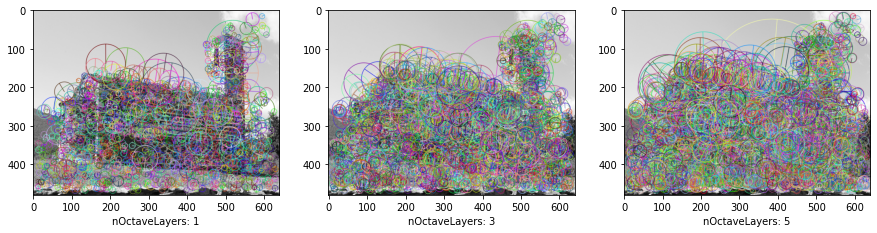

In [89]:
plt.figure(figsize=(15,5))
for idx, i in enumerate(range(1, 6, 2)):
  img = cv.imread(ROOT + img_name[0])
  feature, img = SURF_detector(img, nOctaveLayers=i)
  plt.subplot('13' + str(idx + 1))
  plt.imshow(img[:,:,::-1])
  print('nOctaveLayers:', i, '-> # of features:', len(feature))
  plt.xlabel('nOctaveLayers: ' + str(i))
plt.show()

#### 2-4. extended 변화
- extended는 특징점을 추출한 후 특징 묘사를 하는 과정에서 특징 묘사자(feature descriptor)를 64차원(extended=False)으로 할 것인지 128차원(extended=True)으로 할 것인지를 설정하는 파라미터이다.
- 해당 과제에서는 특징 묘사에 대한 실습은 하지 않으므로 두 값에 대한 결과의 차이는 없다.

extended: True -> # of features: 3263
extended: False -> # of features: 3263


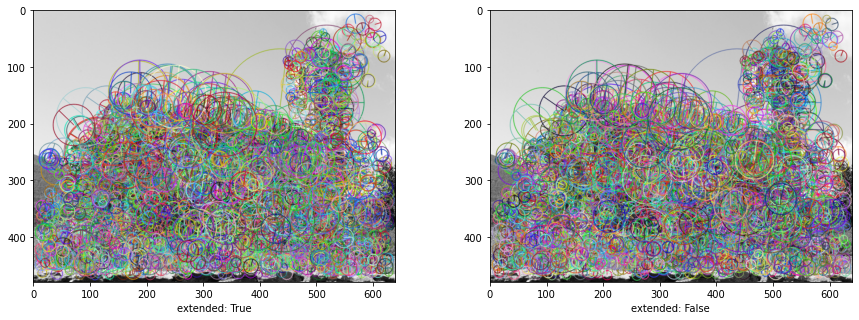

In [90]:
plt.figure(figsize=(15,5))
extendeds = [True, False]
for idx, i in enumerate(extendeds):
  img = cv.imread(ROOT + img_name[0])
  feature, img = SURF_detector(img, extended=i)
  plt.subplot('12' + str(idx + 1))
  plt.imshow(img[:,:,::-1])
  print('extended:', i, '-> # of features:', len(feature))
  plt.xlabel('extended: ' + str(i))
plt.show()

#### 2-5. upright 변화
- upright는 특징점 추출 시 방향성을 포함하여 계산할 지에 대한 여부를 설정하는 파라미터이다.
- 결과를 보면, upright=False인 경우 방향성을 고려하기 때문에 특징점의 벡터 방향이 각각의 해당 방향을 가리키고 있지만, upright=True인 경우 방향성을 고려하지 않아 벡터 방향이 모두 같은 방향을 가리키고 있는 것을 알 수 있다.

upright: True -> # of features: 299
upright: False -> # of features: 299


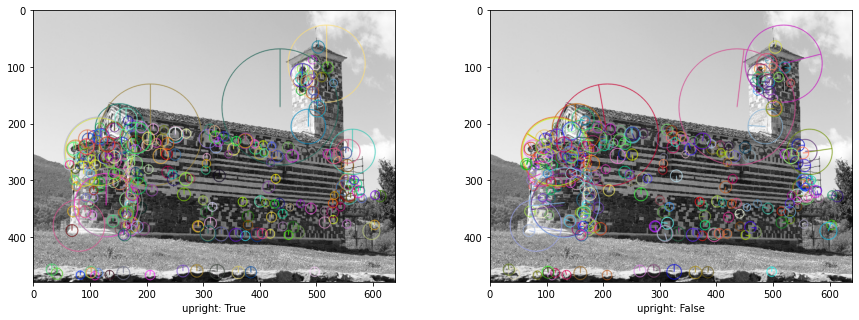

In [93]:
plt.figure(figsize=(15,5))
uprights = [True, False]
for idx, i in enumerate(uprights):
  img = cv.imread(ROOT + img_name[0])
  feature, img = SURF_detector(img, hessianThreshold=5000, upright=i)
  plt.subplot('12' + str(idx + 1))
  plt.imshow(img[:,:,::-1])
  print('upright:', i, '-> # of features:', len(feature))
  plt.xlabel('upright: ' + str(i))
plt.show()

### 3. 제공한 이미지 외에 다른 이미지에도 적용하여 분석해 본다.
- 다른 이미지에 SURF detector를 적용해 본 결과, 아래와 같이 코너를 매우 잘 추출하는 것을 볼 수 있다.

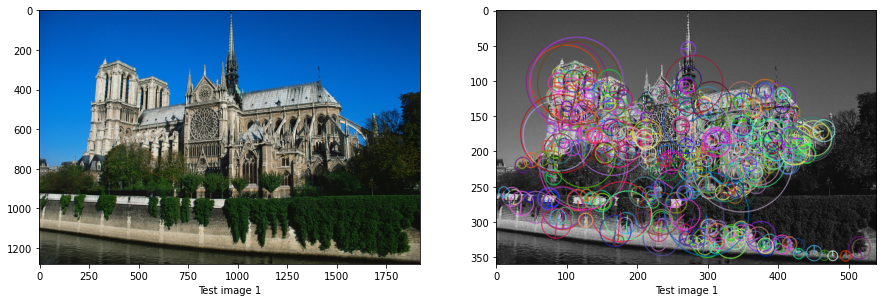

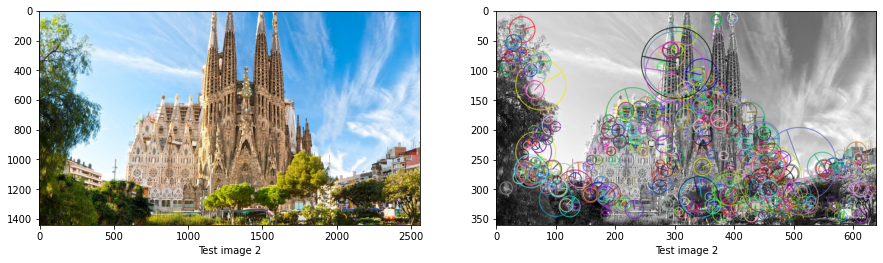

In [96]:
test_name = ['feature/test_im1.PNG', 'feature/test_im2.PNG']
for i, name in enumerate(test_name):
  plt.figure(figsize=(15, 15))
  for j in range(len(test_name)):
    path = ROOT + name
    img = cv.imread(path)
    if j != 0:
      feature, img = SURF_detector(img, new=True, hessianThreshold=3000)
    plt.subplot(str(i + 1) + '2' + str(j + 1))
    plt.imshow(img[:,:,::-1])
    plt.xlabel('Test image ' + str(i + 1))
plt.show()

### 추가 점수 과제

- 지금까지 사용해본 feature detection 알고리즘들을 조사해 보고, 각 알고리즘간의 차이와 장단점을 서술하시오.

1. Harris corner detection
- Harris corner detection는 이미지 위에 일정 크기의 패치를 이동시켜가며 기울기의 변화량을 구한 후 이 변화량을 적절한 기준값으로 구별하여 특징점을 찾는 알고리즘이다.
- Harris corner detection는 영상의 회전, 평행이동, affine 변화, 밝기 변화에는 강인한 반면, 영상의 스케일이 달라지면 매우 취약하다는 단점이 있다.

2. FAST(Feature from Accelerated Segment Test) corner detection
- FAST corner detection은 이름에서도 알 수 있듯이 연산 속도가 빠른 특징점 추출 알고리즘으로, 특징점을 추출할 때 하나의 픽셀을 기준으로 해당 픽셀 중심의 특정 반지름을 가지는 원 내의 픽셀값들과 비교하여 특징점을 추출한다.
- 실습에서 type 파라미터가 비교할 주변 픽셀의 개수를 지정하는 파라미터였다.
- FAST corner detection에서는 특징점 여부를 빠르게 판단하기 위해 중심 픽셀과 주변 픽셀들을 일일히 비교하여 개수를 세는 대신 결정 트리를 사용한다고 한다.
- FAST corner detection의 가장 큰 단점은 어떤 픽셀이 특징점으로 분류되면, 해당 픽셀과 인점한 픽셀들도 특징점으로 추출될 가능성이 높다는 것인데, 이러한 문제를 해결하기 위해 사용하는 방법이 nonmaxSuppression이다.
- nonmaxSuppression을 사용하면, 인접한 여러 점들이 동시에 특징점으로 추출될 가능성을 줄일 수 있다.
- FAST corner detection은 Harris corner detection이나 SIFT corner detection보다 10배 이상 빠름과 동시에 더 좋은 성능을 내기도 한다.
- 그러나 이미지의 노이즈가 심할 경우 강인한 특징점 추출이 어렵다는 단점이 있고, 특징점 벡터의 방향까지는 계산할 수 없다.

3. ORB(Oriented FAST and Rotated BRIEF) corner detection
- ORB corner detection은 FAST corner detection과 BRIEF descriptor를 기반으로 만들어진 알고리즘으로, SURF와 SIFT보다 훨씬 빠르고, SURF보다 정확한 알고리즘이다.
- ORB detector는 FAST corner detection 알고리즘을 통해 특징점을 추출하는데, 이 때 특징점 외의 경계점(edge point)은 제외하기 위해 Harris corner detection 알고리즘을 적용하여 최상위 n개의 특징점만을 추출한다고 한다.
- 또한 이미지 피라미드를 사용하여 특징점을 추출함으로써 영상의 크기 변화에도 강인하다.
- 특징점의 방향성을 계산하기 위해 특징점에 해당하는 패치에 대해 강도(intensity) 중심점을 구한 후, 특징점으로부터 이 강도 중심점까지의 방향을 구하여 해당 특징점의 방향으로 사용한다.

4. SIFT(Scale-Invariant Feature Transform) feature detection
- SIFT의 가장 큰 특징은 이미지의 크기 변화, 회전에 모두 강인하여 이미지 크기가 변하거나 회전하더라도 동일한 특징점을 추출할 수 있다는 점이다.
- 입력 이미지가 있을 때 SIFT는 먼저 이미지의 크기를 피라미드 형태로 축소시켜가며 여러 크기의 이미지를 만들어 낸 후 각각의 크기가 다른 이미지에 대해서 특징점을 추출한다.
- 이런 방식을 사용하면 대부분의 경우 이미지 피라미드 내에서 인접한 이미지 간에는 동일한 특징점이 추출되는데, 이 때 추출된 여러 특징점 중 corner의 특징을 가장 많이 가지고 있는 특징점을 선택함으로써 크기 변화에 강인한 특징점을 추출하게 된다.
- 또한 SIFT가 회전에 강인한 특징점을 추출할 때는 360도를 36개로 등분한 후 패치 내의 픽셀들에 대한 기울기 벡터의 크기와 방향을 36개의 방향에 맵핑하여 기울기 벡터 히스토그램을 만들고, 히스토그램 상에서 값이 가장 큰 기울기 벡터의 방향을 특징점의 방향, 벡터의 크기를 특징점의 크기로 만든다.
- 위와 같은 방법으로 SIFT는 이미지의 크기 변화 및 회전에 대해 강인한 특징점을 추출할 수 있다.
- 그러나 상대적으로 연산 속도는 느리다는 단점이 있다.

5. SURF(Speeded-Up Robust Features) feature detection
- SURF는 SIFT의 연산 속도를 개선하고 안정성을 높인 알고리즘이다.
- SURF는 Upright-SURF라는 기능을 제공하는데, 이는 특징점을 추출할 때 방향성을 판단하지 않고서 추출할 수 있는 기능으로 연산 속도를 높여줄 수 있다.
- 이미지의 특징점을 추출할 때에는 방향성을 판단하지 않아도 되는 경우가 많기 때문에 유용하게 사용될 수 있는 기능이다.
- SURF의 중요한 특징 중 하나는 특징점으로 예상되는 점들을 표시하기 위해 라플라시안 부호를 사용한다는 점인데, 라플라시안 부호를 통해서 특징점들의 밝기 구분이 가능하여 특징점 매칭 시 동일한 부호의 특징점 내에서 매칭시키면 되어 연산 속도를 높일 수 있다고 한다.
- 이러한 다양한 방법을 통해 SURF는 SIFT와 비슷한 성능을 내면서도 연산 속도가 3배나 증가하였다.
- SURF의 경우 블러링과 회전에 대해서는 강인하지만, 시점의 변화, 밝기의 변화에 대해서는 취약하다고 한다.